In [1]:
import os
import numpy as np
import scanpy as sc
from scipy.spatial import Delaunay
import scipy.sparse as sp
import pygsp as pg
from scipy.linalg import eigh
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, TwoSlopeNorm
import matplotlib as mpl
import gseapy as gp

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/paracrine_tonsil_fh/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
# Load
adata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/tonsil_fh/filtered/adata_paracrine.h5ad')

# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 10
fignorm = set_width / width
figsize = (set_width, height*fignorm)
sc.set_figure_params(figsize=figsize)

In [4]:
adata

AnnData object with n_obs × n_vars = 1349474 × 377
    obs: 'transcript_counts', 'n_counts'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'paracrine'

In [5]:
filter_key = 'paracrine'
max_mag = 2

# Scale
sc.pp.scale(adata, layer=filter_key)

# Clip
X = adata.layers[filter_key]
X[X > max_mag] = max_mag
X[X < -max_mag] = -max_mag

# Calculate PCs

In [6]:
C = adata.layers[filter_key].T @ adata.layers[filter_key]
w,V = eigh(C)
w = w[::-1]
V = V[:,::-1]

# Plot multiple PCs

==================== PC1 ====================


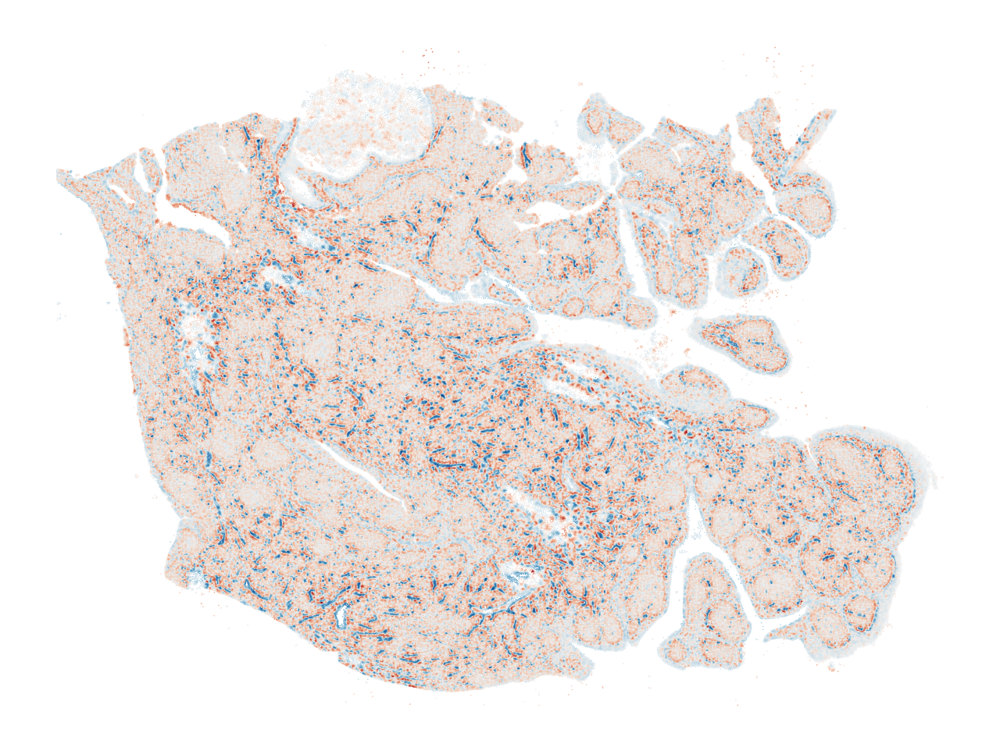

Positive markers:  ['PTPRC', 'TRAC', 'CYTIP', 'SELL', 'CXCR4', 'MS4A1', 'CD2', 'CD3D', 'CD3E', 'BANK1']
Negative markers:  ['CAVIN1', 'CD34', 'CD93', 'ADGRL4', 'ECSCR', 'PECAM1', 'VWF', 'MMRN2', 'EGFL7', 'GNG11']



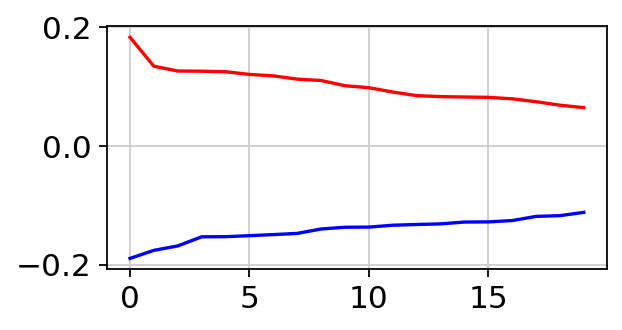

==================== PC5 ====================


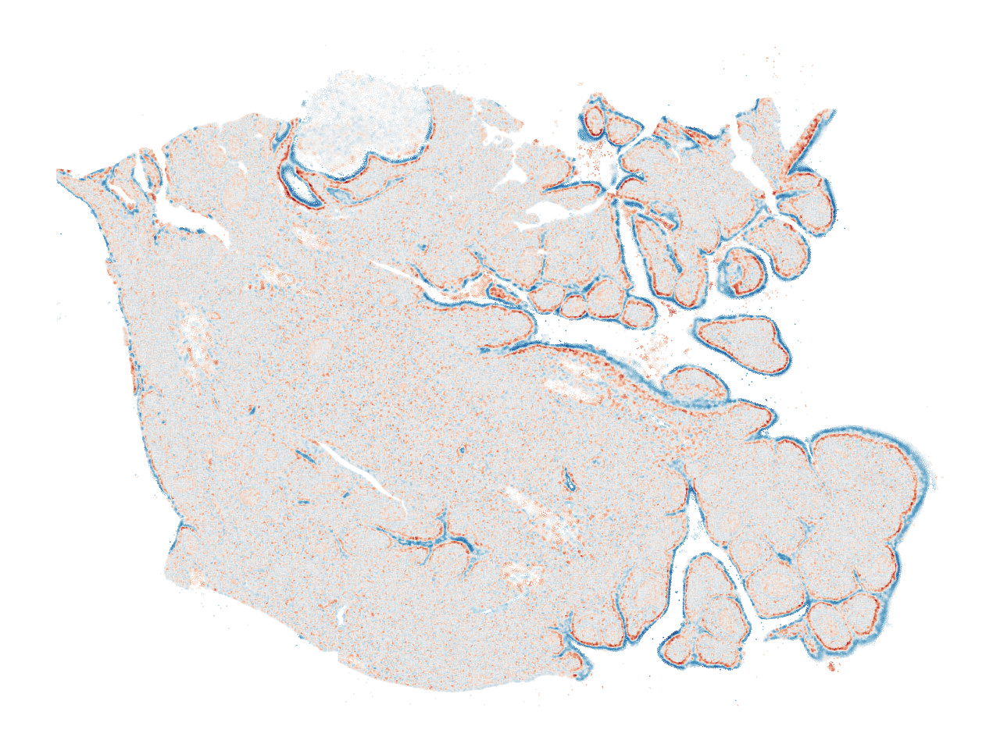

Positive markers:  ['TNC', 'PDPN', 'MKI67', 'PCNA', 'LTBP2', 'CTSK', 'DST', 'CFB', 'CDK1', 'FHL2']
Negative markers:  ['MALL', 'SERPINB2', 'EHF', 'CYP4B1', 'AQP3', 'KLK11', 'ELF5', 'RTKN2', 'ERBB2', 'APOBEC3A']



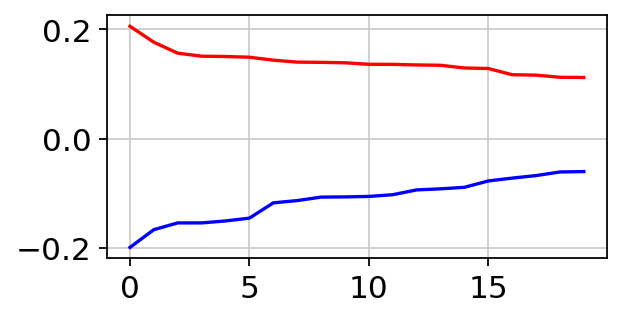

In [8]:
good_pcs = [0,4]
cmap = 'RdBu_r'
n_markers = 10
for i in good_pcs:

    print('='*20, f'PC{i+1}', '='*20)

    # Calculate PC
    c = adata.layers[filter_key] @ V[:,i]
    adata.obs[f'c{i}'] = c

    # Plot in tissue
    norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
    points = adata.obsm['spatial']
    plt.figure(figsize=figsize)
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.005,
        s=0.5,
        c=c,
        cmap=cmap,
        norm=norm,
    )
    plt.axis('off')
    filename = os.path.join(figpath, f'paracrine_pc{i+1}.png')
    plt.savefig(filename, dpi=dpi)
    plt.show()
    
    # Print markers
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))
    print()
    
    # Print weights
    plt.figure(figsize=(4,2))
    plt.plot(np.sort(V[:,i])[::-1][:20], c='r')
    plt.plot(np.sort(V[:,i])[:20], c='b')
    plt.show()

# Zooms

## PC1

### Zoom 1

In [48]:
i = 0

In [55]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/5
zoom_height = height/10

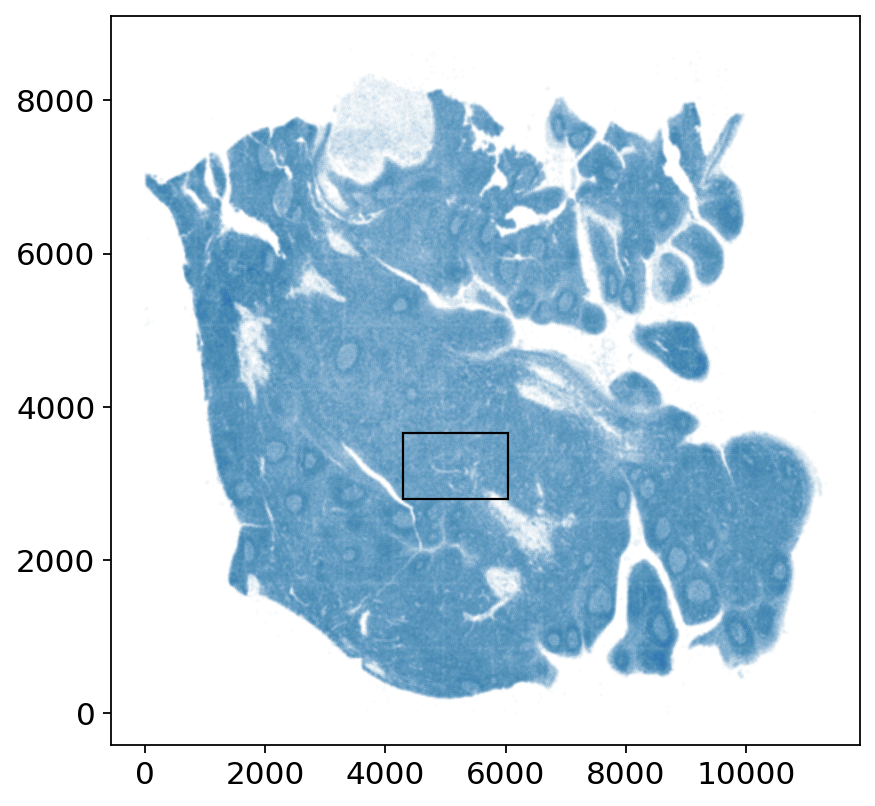

In [59]:
zoom_x = 4300
zoom_y = 2800

plt.figure(figsize=(6,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.0001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [60]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

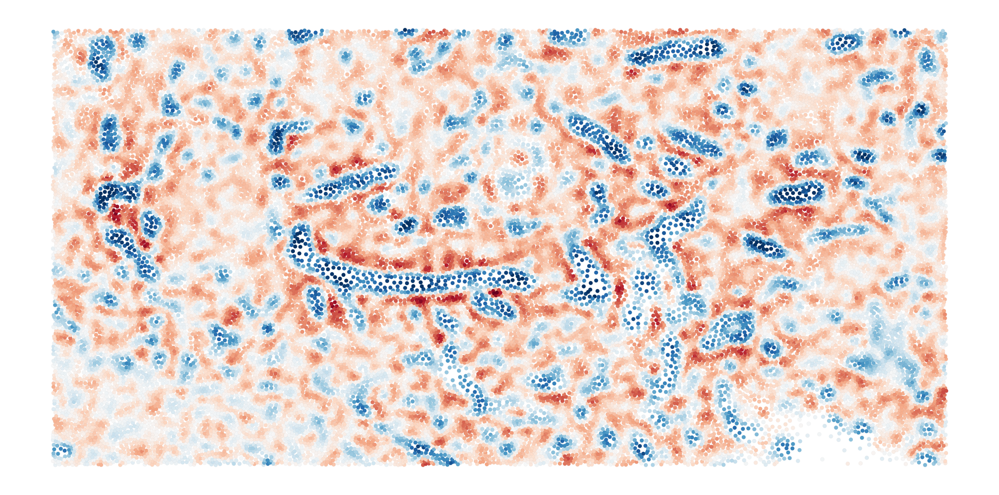

In [61]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=12,
    c=zdata.obs[f'c{i}'],
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'paracrine_zoom_pc{i+1}.png')
plt.savefig(filename, dpi=dpi)
plt.show()

## PC5

### Zoom 1

In [62]:
i = 4

In [70]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/8
zoom_height = height/6

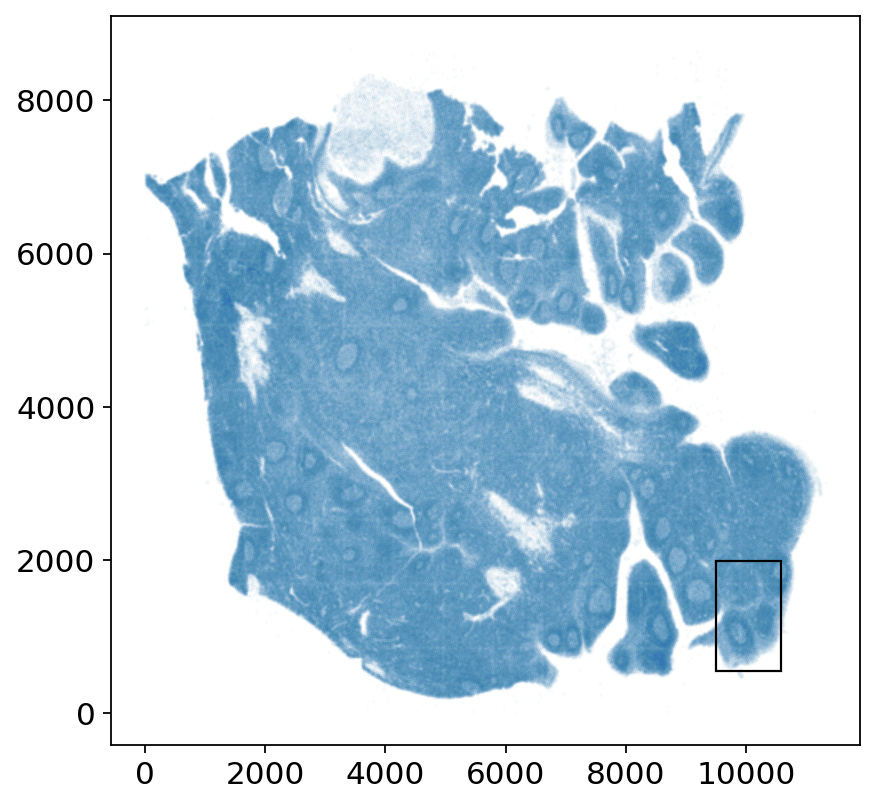

In [71]:
zoom_x = 9500
zoom_y = 550

plt.figure(figsize=(6,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.0001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [72]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

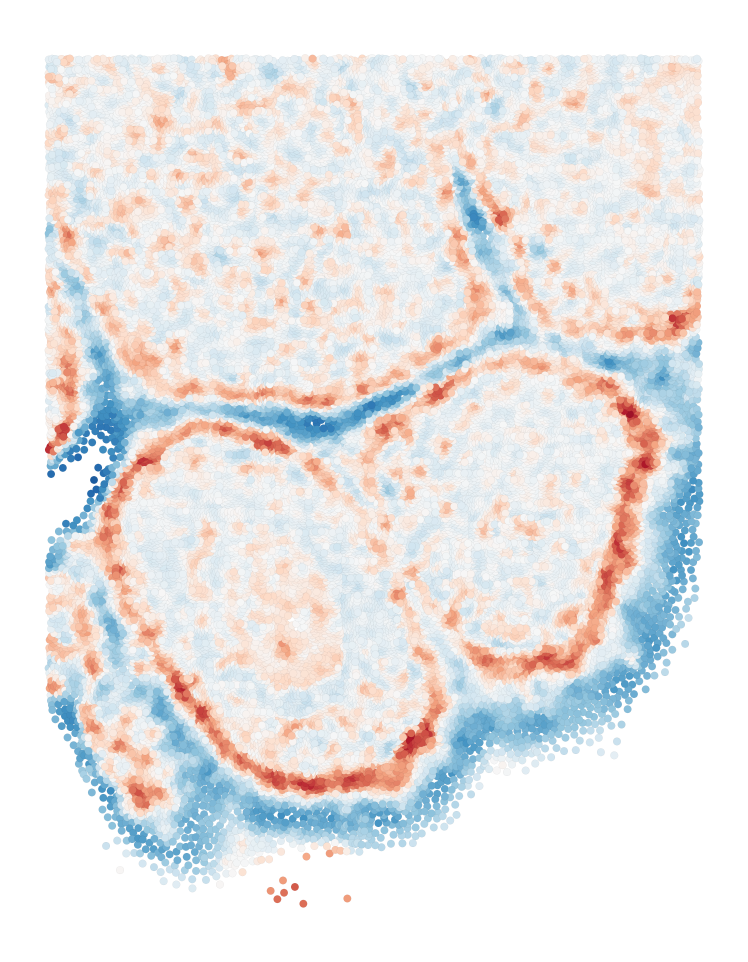

In [73]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=12,
    c=zdata.obs[f'c{i}'],
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'paracrine_zoom_pc{i+1}.png')
plt.savefig(filename, dpi=dpi)
plt.show()